
The train.csv and test.csv files contain metadata for photos in the training set and test set, respectively. Each pet photo is labeled with the value of 1 (Yes) or 0 (No) for each of the following features:

Focus - Pet stands out against uncluttered background, not too close / far.

Eyes - Both eyes are facing front or near-front, with at least 1 eye / pupil decently clear.

Face - Decently clear face, facing front or near-front.

Near - Single pet taking up significant portion of photo (roughly over 50% of photo width or height).

Action - Pet in the middle of an action (e.g., jumping).

Accessory - Accompanying physical or digital accessory / prop (i.e. toy, digital sticker), excluding collar and leash.

Group - More than 1 pet in the photo.

Collage - Digitally-retouched photo (i.e. with digital photo frame, combination of multiple photos).

Human - Human in the photo.

Occlusion - Specific undesirable objects blocking part of the pet (i.e. human, cage or fence). Note that not all blocking objects are considered occlusion.

Info - Custom-added text or labels (i.e. pet name, description).

Blur - Noticeably out of focus or noisy, especially for the pet’s eyes and face. For Blur entries, “Eyes” column is always set to 0.


Файлы train.csv и test.csv содержат метаданные для фотографий в обучающем наборе и тестовом наборе соответственно. Каждой фотографии домашнего животного присвоено значение 1 (Да) или 0 (Нет) для каждой из следующих характеристик:

Фокус – питомец выделяется на лаконичном фоне, не слишком близко/далеко.

Глаза. Оба глаза смотрят вперед или почти вперед, по крайней мере один глаз/зрачок достаточно ясный.

Лицо. Достаточно чистое лицо, обращенное вперед или почти вперед.

Рядом — один питомец занимает значительную часть фотографии (примерно более 50 % ширины или высоты фотографии).

Действие — питомец в середине действия (например, прыжка).

Аксессуар — сопровождающий физический или цифровой аксессуар/реквизит (например, игрушка, цифровая наклейка), за исключением ошейника и поводка.

Группа - На фото более 1 питомца.

Коллаж — фотография, обработанная цифровой ретушью (т. е. с использованием цифровой фоторамки, комбинация нескольких фотографий).

Человек - Человек на фотографии.

Окклюзия — определенные нежелательные объекты, блокирующие часть тела животного (например, человека, клетку или забор). Обратите внимание, что не все блокирующие объекты считаются окклюзией.

Информация — добавленный пользователем текст или метки (например, имя питомца, описание).

Размытие — заметно не в фокусе или шум, особенно на глазах и морде животного. Для записей «Размытие» в столбце «Глаза» всегда установлено значение 0.

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from PIL import Image


In [8]:
df = pd.read_csv('train.csv')

In [9]:
df

,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
0,0007de18844b0dbbb5e1f607da0606e0,0,1,1,1,0,0,1,0,0,0,0,0,63
1,0009c66b9439883ba2750fb825e1d7db,0,1,1,0,0,0,0,0,0,0,0,0,42
2,0013fd999caf9a3efe1352ca1b0d937e,0,1,1,1,0,0,0,0,1,1,0,0,28
3,0018df346ac9c1d8413cfcc888ca8246,0,1,1,1,0,0,0,0,0,0,0,0,15
4,001dc955e10590d3ca4673f034feeef2,0,0,0,1,0,0,1,0,0,0,0,0,72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9907,ffbfa0383c34dc513c95560d6e1fdb57,0,0,0,1,0,0,0,0,0,0,0,1,15
9908,ffcc8532d76436fc79e50eb2e5238e45,0,1,1,1,0,0,0,0,0,0,0,0,70
9909,ffdf2e8673a1da6fb80342fa3b119a20,0,1,1,1,0,0,0,0,1,1,0,0,20
9910,fff19e2ce11718548fa1c5d039a5192a,0,1,1,1,0,0,0,0,1,0,0,0,20


In [10]:
df.loc[df['Pawpularity'] == min(df['Pawpularity'])]

,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
2442,3ed899a8334a8e5c74f4a554f3ce6f08,0,1,1,1,0,0,0,0,0,0,0,0,1
3232,53b536999aecd800cfda720f3ca363cb,0,1,1,1,0,0,0,0,0,0,0,0,1
4235,6c159aede3df25fdbe781431aabcfc67,0,1,1,1,0,0,0,0,0,0,0,0,1
8674,e0a1efdaf4fbed8659b6d23994ee346e,0,1,1,1,0,0,0,0,1,1,0,0,1


In [11]:
df.loc[df['Pawpularity'] == max(df['Pawpularity'])]

,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
19,00768659c1c90409f81dcdecbd270513,0,1,1,0,0,0,0,0,0,0,0,0,100
50,013f86ed0e765b189990d3d5ac28bd7d,0,0,0,1,0,0,1,0,0,0,0,0,100
86,0254f54b148543442373d5aad45b2d1a,0,1,1,1,0,0,0,0,0,0,0,0,100
182,04fef9f129bc6e4b90644d4290fde8c3,0,1,1,1,0,0,0,0,0,0,0,0,100
227,063d79b149f4d163eae86f777a39a42f,0,0,1,1,0,0,0,0,0,0,0,1,100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9684,fa27d0eeeec835a00853d382f8777b19,0,1,1,1,0,0,0,0,0,0,0,0,100
9725,fb1b85c23f5cc8a079387ff575b67b50,0,1,1,1,0,0,0,0,0,0,1,0,100
9836,fde75ba22f491d31c9267e59f6cbfe1a,0,1,1,1,0,0,0,0,0,0,0,0,100
9843,fe200aff478f55ca4bcf77d9dade1217,0,1,1,1,0,0,0,0,0,0,0,0,100


In [12]:
df.isna().sum()

Id               0
Subject Focus    0
Eyes             0
Face             0
Near             0
Action           0
Accessory        0
Group            0
Collage          0
Human            0
Occlusion        0
Info             0
Blur             0
Pawpularity      0
dtype: int64

In [13]:
paths = df['Id']
paths

0       0007de18844b0dbbb5e1f607da0606e0
1       0009c66b9439883ba2750fb825e1d7db
2       0013fd999caf9a3efe1352ca1b0d937e
3       0018df346ac9c1d8413cfcc888ca8246
4       001dc955e10590d3ca4673f034feeef2
                      ...               
9907    ffbfa0383c34dc513c95560d6e1fdb57
9908    ffcc8532d76436fc79e50eb2e5238e45
9909    ffdf2e8673a1da6fb80342fa3b119a20
9910    fff19e2ce11718548fa1c5d039a5192a
9911    fff8e47c766799c9e12f3cb3d66ad228
Name: Id, Length: 9912, dtype: object

In [14]:
fmt = lambda s: 'data/train/' + s + '.jpg'

In [15]:
paths = np.vectorize(fmt)(paths)
paths

array(['data/train/0007de18844b0dbbb5e1f607da0606e0.jpg',
       'data/train/0009c66b9439883ba2750fb825e1d7db.jpg',
       'data/train/0013fd999caf9a3efe1352ca1b0d937e.jpg', ...,
       'data/train/ffdf2e8673a1da6fb80342fa3b119a20.jpg',
       'data/train/fff19e2ce11718548fa1c5d039a5192a.jpg',
       'data/train/fff8e47c766799c9e12f3cb3d66ad228.jpg'], dtype='<U47')

In [16]:
df['Pawpularity']=df['Pawpularity']/100
df

,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
0,0007de18844b0dbbb5e1f607da0606e0,0,1,1,1,0,0,1,0,0,0,0,0,0.63
1,0009c66b9439883ba2750fb825e1d7db,0,1,1,0,0,0,0,0,0,0,0,0,0.42
2,0013fd999caf9a3efe1352ca1b0d937e,0,1,1,1,0,0,0,0,1,1,0,0,0.28
3,0018df346ac9c1d8413cfcc888ca8246,0,1,1,1,0,0,0,0,0,0,0,0,0.15
4,001dc955e10590d3ca4673f034feeef2,0,0,0,1,0,0,1,0,0,0,0,0,0.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9907,ffbfa0383c34dc513c95560d6e1fdb57,0,0,0,1,0,0,0,0,0,0,0,1,0.15
9908,ffcc8532d76436fc79e50eb2e5238e45,0,1,1,1,0,0,0,0,0,0,0,0,0.70
9909,ffdf2e8673a1da6fb80342fa3b119a20,0,1,1,1,0,0,0,0,1,1,0,0,0.20
9910,fff19e2ce11718548fa1c5d039a5192a,0,1,1,1,0,0,0,0,1,0,0,0,0.20


In [12]:
#TODO: вывести изображения при помощи plt

In [17]:
df.drop(['Id'],axis=1,inplace=True)
df

,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
0,0,1,1,1,0,0,1,0,0,0,0,0,0.63
1,0,1,1,0,0,0,0,0,0,0,0,0,0.42
2,0,1,1,1,0,0,0,0,1,1,0,0,0.28
3,0,1,1,1,0,0,0,0,0,0,0,0,0.15
4,0,0,0,1,0,0,1,0,0,0,0,0,0.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9907,0,0,0,1,0,0,0,0,0,0,0,1,0.15
9908,0,1,1,1,0,0,0,0,0,0,0,0,0.70
9909,0,1,1,1,0,0,0,0,1,1,0,0,0.20
9910,0,1,1,1,0,0,0,0,1,0,0,0,0.20


## Визуализация изображений

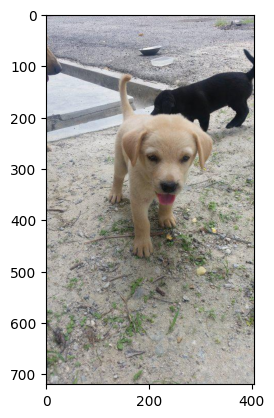

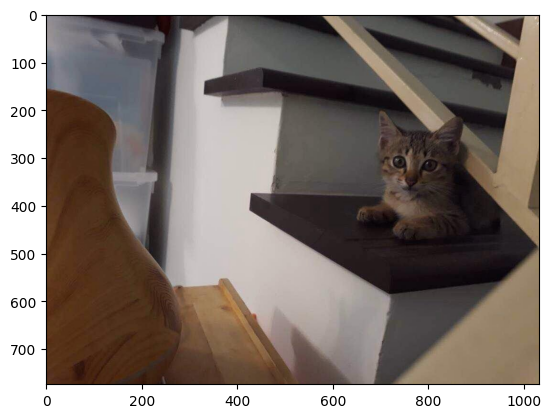

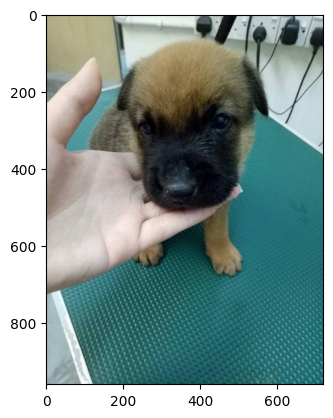

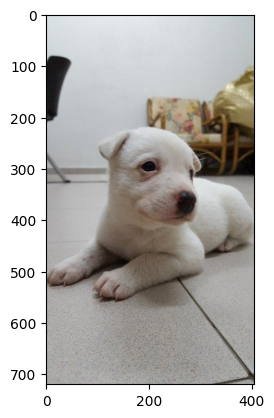

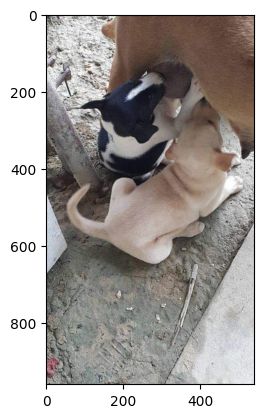

...

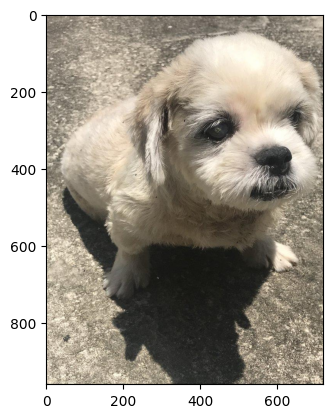

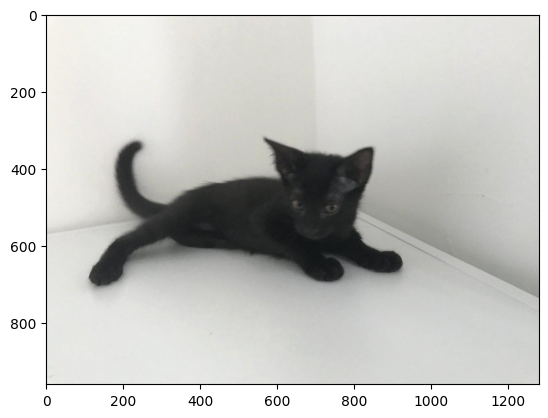

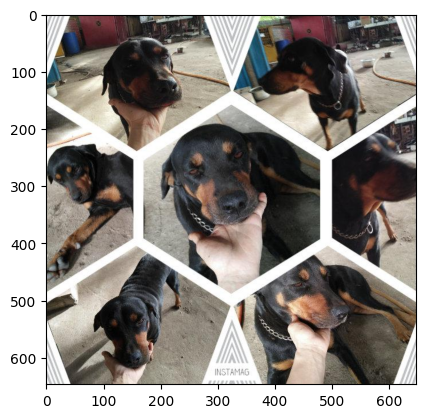

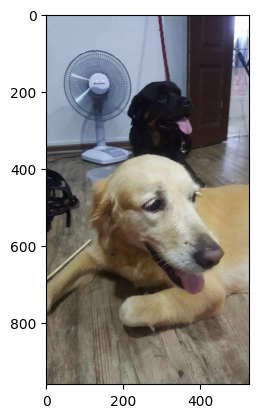

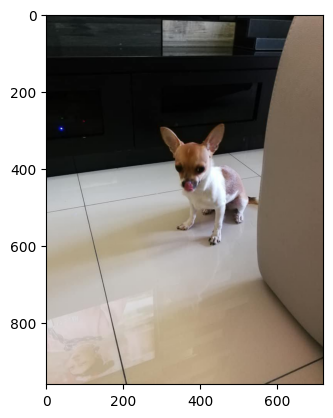

In [14]:
fnames = paths[0:20]
for x in fnames:
    img = Image.open(x)
    plt.figure()
    plt.imshow(img)
    

## Матрица корреляции признаков

<Axes: >

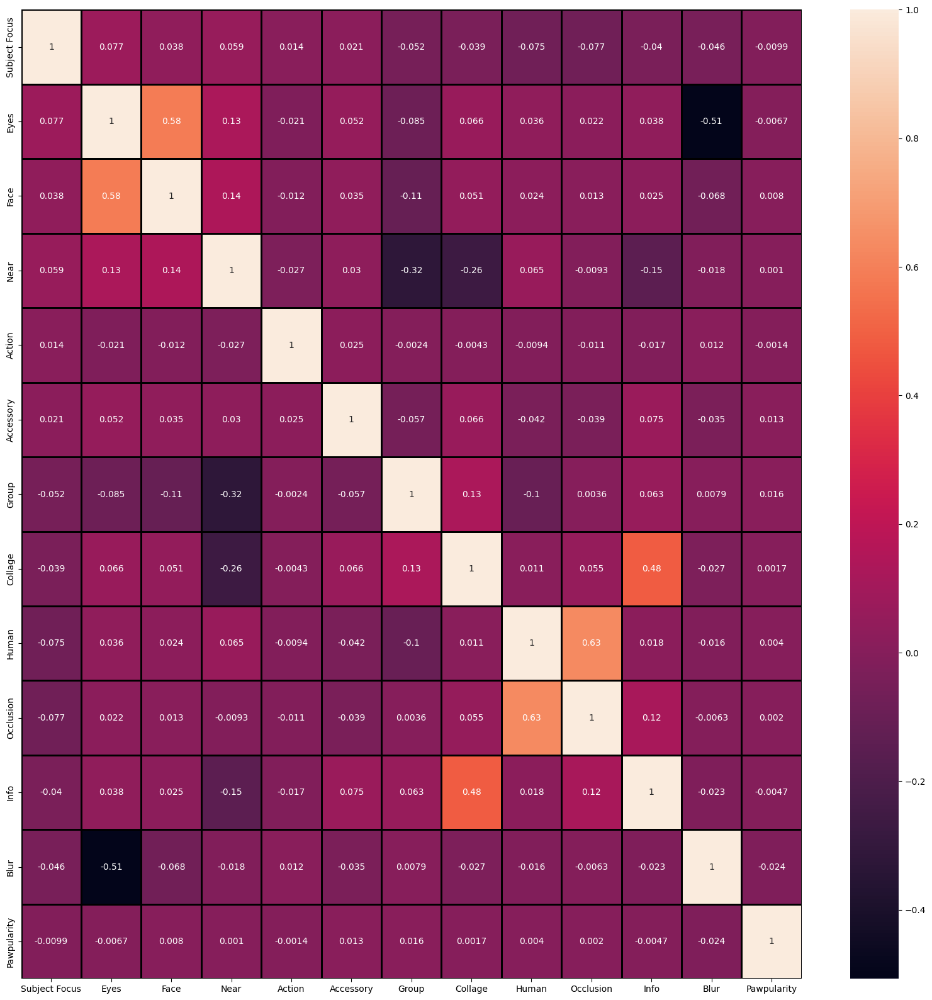

In [15]:
plt.figure(figsize=(20, 20))
sns.heatmap(df.corr(), annot = True,linewidths=1, linecolor='black')

*О чем нам говорит матрица корреляции?*

Отрицательная корреляция признаков Blur и Eyes. Если изображение размыто, то скорее всего Eyes == 1

Положительная корреляция признаков Eyes и Face. Если на изображении видна морда питомца, то скорее всего и Eyes == 1, и наоборот

Отрицательная корреляция признаков Group и Near.

Отрицательная корреляция признаков near и collage. Если изображение является коллажем, то скорее всего питомцы не занимают 50% высоты и ширины фотографии

Положительная корреляция признаков Collage и info. Если изображение является коллажем, то скорее всего на фото присутствует доп информация

Положительная корреляция признаков Human и Occlusion.  Если на фото есть человек, то он воспринимается как препятствие 
Положительная корреляция признаков info и Occlusion.  Если на фото есть доп информация, то он воспринимается как препятствие 


In [16]:
#df

data/train/fd5077fc8b795557bb9b0da7f8e2fc4e.jpg


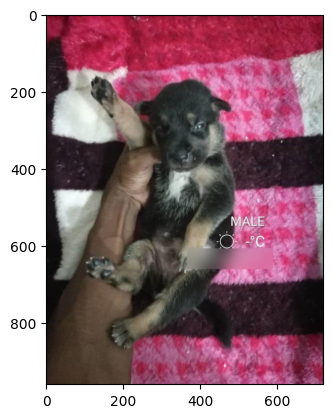

In [17]:
print(paths[9813])
img = Image.open(paths[9813])
plt.imshow(img)

## Collage и near

In [18]:
df.loc[(df["Collage"] == 0)&(df["Near"] == 1) ]

,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
0,0,1,1,1,0,0,1,0,0,0,0,0,0.63
2,0,1,1,1,0,0,0,0,1,1,0,0,0.28
3,0,1,1,1,0,0,0,0,0,0,0,0,0.15
4,0,0,0,1,0,0,1,0,0,0,0,0,0.72
6,0,1,1,1,0,0,0,0,1,1,0,0,0.22
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9907,0,0,0,1,0,0,0,0,0,0,0,1,0.15
9908,0,1,1,1,0,0,0,0,0,0,0,0,0.70
9909,0,1,1,1,0,0,0,0,1,1,0,0,0.20
9910,0,1,1,1,0,0,0,0,1,0,0,0,0.20


## Collage и Info

In [19]:
df.loc[df["Collage"] == 1 ]

,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
7,0,1,1,0,0,0,1,1,0,0,1,0,0.35
17,0,1,1,0,0,0,0,1,1,1,0,0,0.69
20,0,1,1,1,0,0,0,1,0,0,0,0,0.29
52,0,1,1,1,0,0,0,1,0,0,1,0,0.28
56,0,1,1,0,0,0,1,1,0,0,1,0,0.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9755,0,1,1,1,0,0,0,1,0,0,1,0,0.53
9766,0,1,1,0,0,0,0,1,0,0,1,0,0.19
9847,0,1,1,1,0,1,0,1,0,1,1,0,0.28
9888,0,1,1,0,0,0,1,1,0,0,1,0,0.38


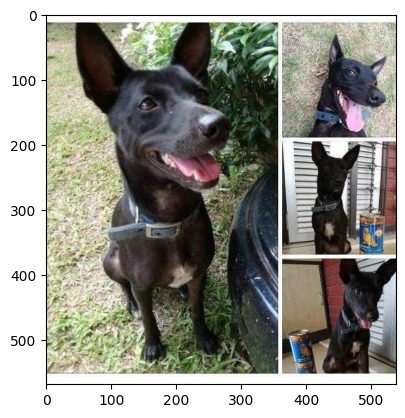

In [20]:
img = Image.open(paths[20])
plt.imshow(img)

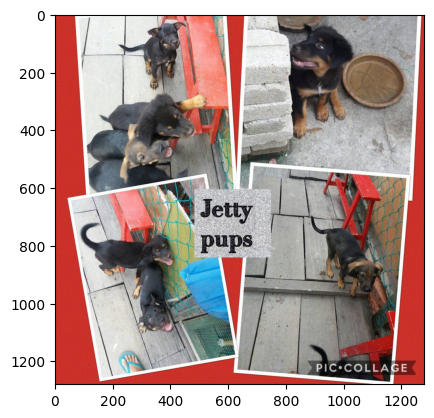

In [21]:
img = Image.open(paths[7])
plt.imshow(img)

## Human и Occlusion

In [22]:
df.loc[df["Human"] == 1]

,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
2,0,1,1,1,0,0,0,0,1,1,0,0,0.28
6,0,1,1,1,0,0,0,0,1,1,0,0,0.22
13,0,1,1,1,0,0,0,0,1,1,0,0,0.41
17,0,1,1,0,0,0,0,1,1,1,0,0,0.69
25,0,0,1,1,0,0,0,0,1,0,0,1,0.15
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9874,0,1,1,1,0,0,0,0,1,1,0,0,0.64
9890,0,1,1,1,0,0,0,0,1,1,0,0,0.29
9903,0,1,1,0,0,0,0,0,1,1,0,0,0.51
9909,0,1,1,1,0,0,0,0,1,1,0,0,0.20


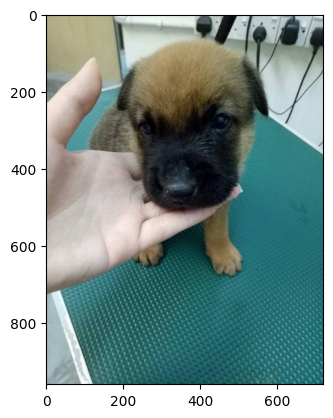

In [23]:
img = Image.open(paths[2])
plt.imshow(img)

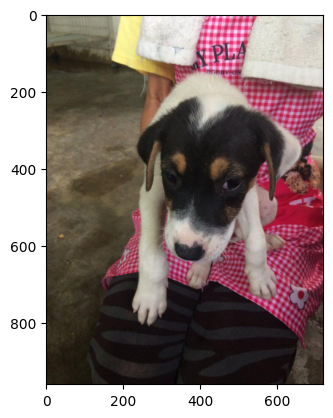

In [24]:
img = Image.open(paths[9910])
plt.imshow(img)

## info и Occlusion

In [25]:
df.loc[df["Info"] == 1]

,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
7,0,1,1,0,0,0,1,1,0,0,1,0,0.35
51,0,1,1,1,0,0,0,0,1,0,1,0,0.13
52,0,1,1,1,0,0,0,1,0,0,1,0,0.28
56,0,1,1,0,0,0,1,1,0,0,1,0,0.25
76,1,1,1,1,0,0,0,0,0,0,1,0,0.26
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9811,0,1,1,0,0,0,1,0,0,0,1,0,0.17
9813,0,1,1,1,0,0,0,0,1,1,1,0,0.38
9847,0,1,1,1,0,1,0,1,0,1,1,0,0.28
9888,0,1,1,0,0,0,1,1,0,0,1,0,0.38


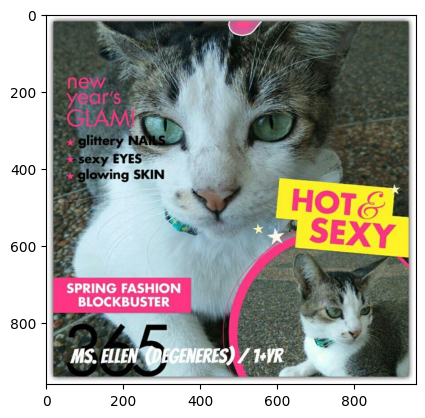

In [26]:
img = Image.open(paths[9847])
plt.imshow(img)

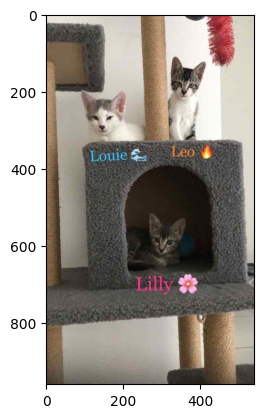

In [27]:
img = Image.open(paths[9811])
plt.imshow(img)

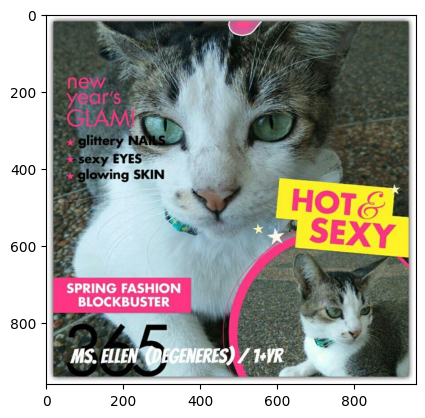

In [28]:
img = Image.open(paths[9847])
plt.imshow(img)

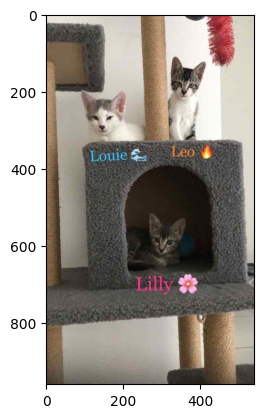

In [29]:
img = Image.open(paths[9811])
plt.imshow(img)

## 

In [18]:
df

,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity
0,0,1,1,1,0,0,1,0,0,0,0,0,0.63
1,0,1,1,0,0,0,0,0,0,0,0,0,0.42
2,0,1,1,1,0,0,0,0,1,1,0,0,0.28
3,0,1,1,1,0,0,0,0,0,0,0,0,0.15
4,0,0,0,1,0,0,1,0,0,0,0,0,0.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9907,0,0,0,1,0,0,0,0,0,0,0,1,0.15
9908,0,1,1,1,0,0,0,0,0,0,0,0,0.70
9909,0,1,1,1,0,0,0,0,1,1,0,0,0.20
9910,0,1,1,1,0,0,0,0,1,0,0,0,0.20


In [19]:
X=df.drop(['Pawpularity'], axis=1)
Y = df['Pawpularity']

In [20]:
X

,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur
0,0,1,1,1,0,0,1,0,0,0,0,0
1,0,1,1,0,0,0,0,0,0,0,0,0
2,0,1,1,1,0,0,0,0,1,1,0,0
3,0,1,1,1,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9907,0,0,0,1,0,0,0,0,0,0,0,1
9908,0,1,1,1,0,0,0,0,0,0,0,0
9909,0,1,1,1,0,0,0,0,1,1,0,0
9910,0,1,1,1,0,0,0,0,1,0,0,0


In [21]:
Y

0       0.63
1       0.42
2       0.28
3       0.15
4       0.72
        ... 
9907    0.15
9908    0.70
9909    0.20
9910    0.20
9911    0.30
Name: Pawpularity, Length: 9912, dtype: float64

In [30]:
# разобьем датасет
from sklearn.model_selection import train_test_split

In [31]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.2, random_state=5)

In [36]:
print(X_train.shape)
print(Y_train.shape)
print(X_test.shape)
print(Y_test.shape)

(7929, 12)
(7929,)
(1983, 12)
(1983,)


In [5]:
from sklearn.linear_model import LinearRegression 
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor
from sklearn.metrics import r2_score, root_mean_squared_error
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV

In [52]:
#построим и обучим модели
lr = LinearRegression()
dtr = DecisionTreeRegressor()
rfr = RandomForestRegressor()
abr = AdaBoostRegressor()
svr =  SVR()

In [53]:
hist_lr=lr.fit(X_train, Y_train)
hist_dtr=dtr.fit(X_train, Y_train)
hist_rfr=rfr.fit(X_train, Y_train)
hist_abr=abr.fit(X_train, Y_train)
hist_svr = svr.fit(X_train, Y_train)

для тренировочной выборки: 
-----------------------------
RMSE=0.20472492053745955
R2=0.003536331430768147


Text(0.5, 1.0, 'диаграмма рассеивания')

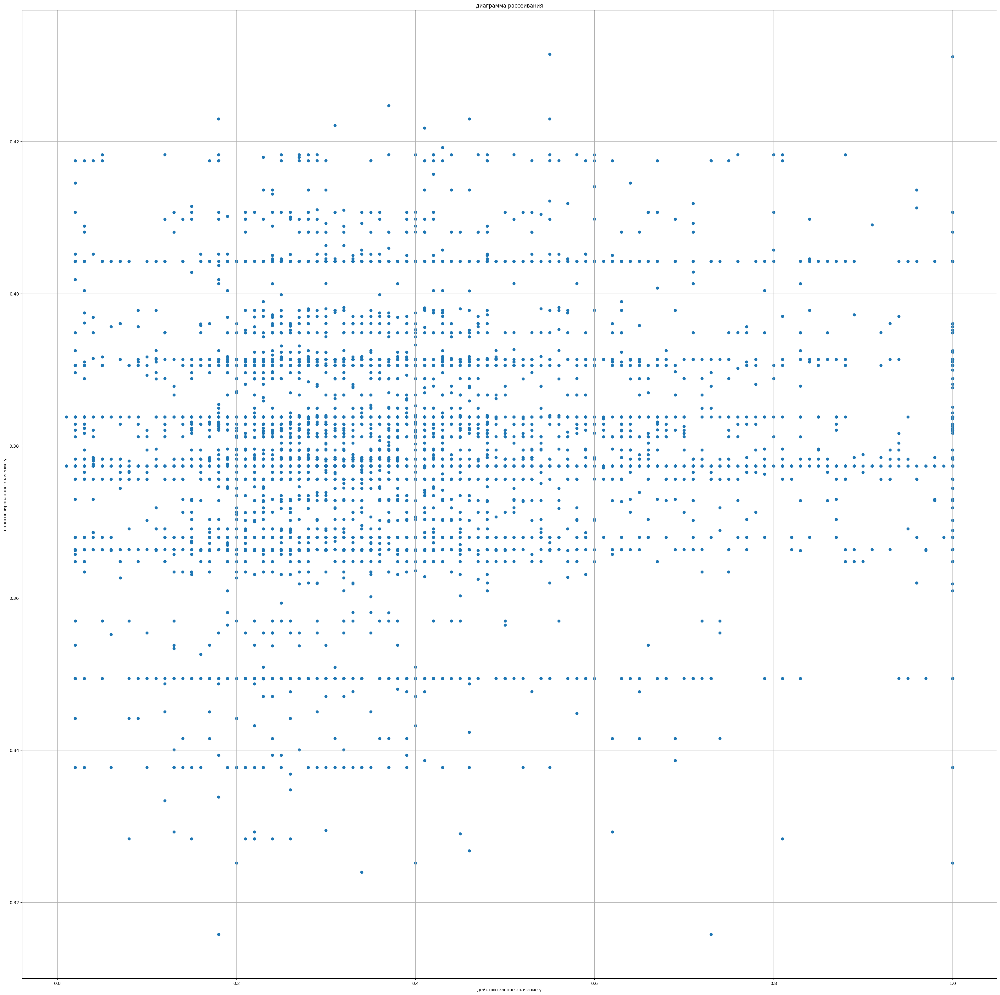

In [48]:
#оценка модели линейной регресси для тренировочной выборки
y_lr_train_pred = lr.predict(X_train)
rmse = root_mean_squared_error(Y_train, y_lr_train_pred)
r2 = r2_score(Y_train, y_lr_train_pred)

print("для тренировочной выборки: ")
print("-----------------------------")
print("RMSE={}".format(rmse))
print("R2={}".format(r2))

plt.figure(figsize=(40,40))
plt.scatter(Y_train, y_lr_train_pred)
plt.grid()
plt.xlabel("действительное значение y")
plt.ylabel("спрогнозированное значение y")
plt.title("диаграмма рассеивания")

для тестовой выборки: 
-----------------------------
RMSE=0.20957509072126176
R2=-0.004288223881982356


Text(0.5, 1.0, 'диаграмма рассеивания')

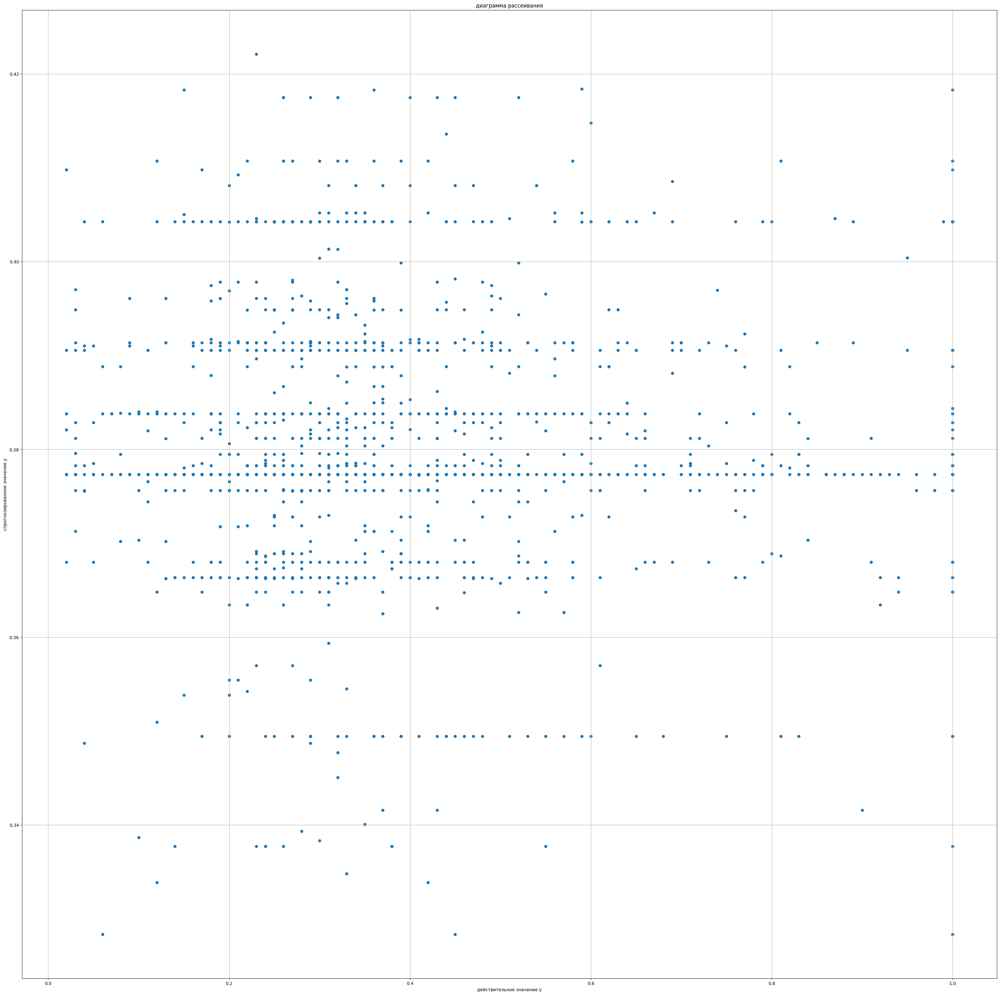

In [41]:
#оценка модели линейной регресси для тестовой выборки
y_lr_test_pred = lr.predict(X_test)
rmse = root_mean_squared_error(Y_test, y_lr_test_pred)
r2 = r2_score(Y_test, y_lr_test_pred)

print("для тестовой выборки: ")
print("-----------------------------")
print("RMSE={}".format(rmse))
print("R2={}".format(r2))
plt.figure(figsize=(40,40))
plt.scatter(Y_test, y_lr_test_pred)
plt.grid()
plt.xlabel("действительное значение y")
plt.ylabel("спрогнозированное значение y")
plt.title("диаграмма рассеивания")

In [42]:
#TODO: подобрать гиперпараметры для линейной ргрессии

## DecisionTreeRegressor

для тренировочной выборки: 
-----------------------------
RMSE=0.20143154686333714
R2=0.03533833112304141


Text(0.5, 1.0, 'диаграмма рассеивания')

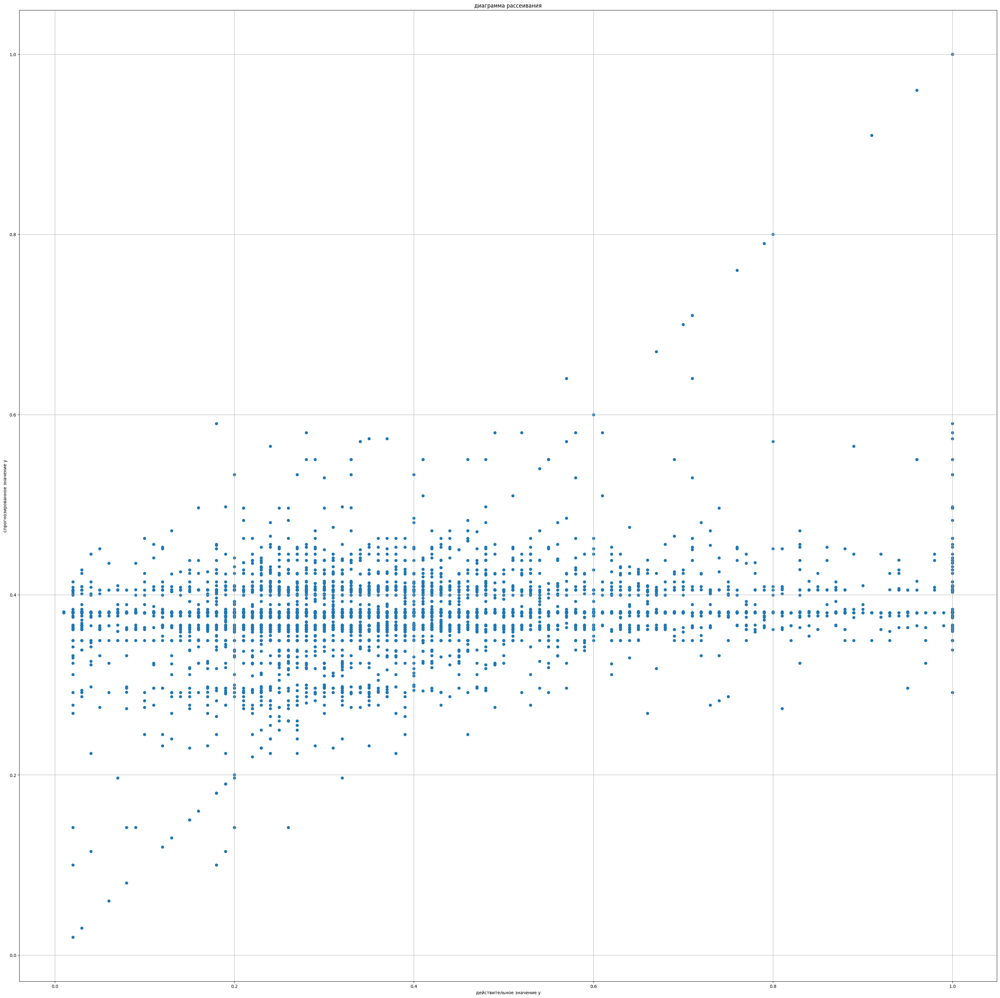

In [56]:
#оценка модели DecisionTreeRegressor для тренировочной выборки
y_dtr_train_pred = dtr.predict(X_train)
rmse = root_mean_squared_error(Y_train, y_dtr_train_pred)
r2 = r2_score(Y_train, y_dtr_train_pred)

print("для тренировочной выборки: ")
print("-----------------------------")
print("RMSE={}".format(rmse))
print("R2={}".format(r2))

plt.figure(figsize=(40,40))
plt.scatter(Y_train, y_dtr_train_pred)
plt.grid()
plt.xlabel("действительное значение y")
plt.ylabel("спрогнозированное значение y")
plt.title("диаграмма рассеивания")

для тренировочной выборки: 
-----------------------------
RMSE=0.2115152358655721
R2=-0.022968725354882924


Text(0.5, 1.0, 'диаграмма рассеивания')

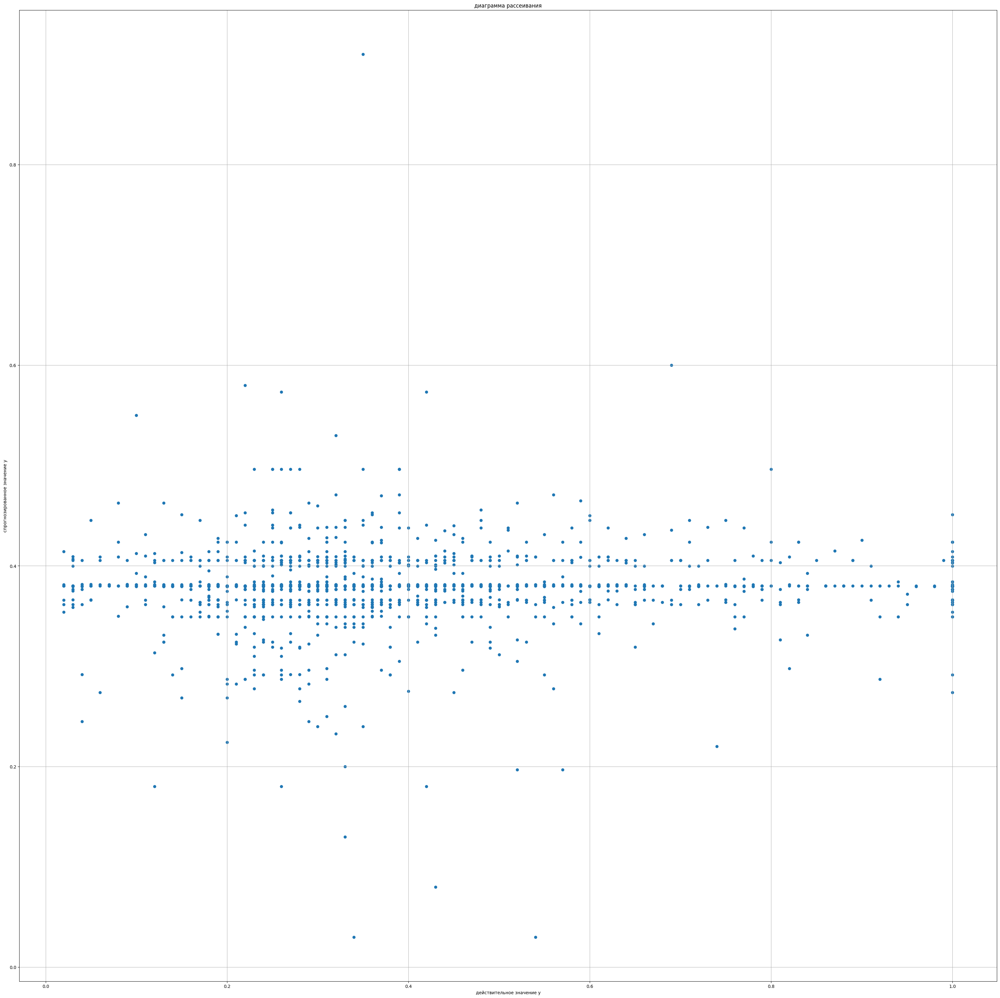

In [45]:
#оценка модели DecisionTreeRegressor для тестовой выборки
y_dtr_test_pred = dtr.predict(X_test)
rmse = root_mean_squared_error(Y_test, y_dtr_test_pred)
r2 = r2_score(Y_test, y_dtr_test_pred)

print("для тренировочной выборки: ")
print("-----------------------------")
print("RMSE={}".format(rmse))
print("R2={}".format(r2))

plt.figure(figsize=(40,40))
plt.scatter(Y_test, y_dtr_test_pred)
plt.grid()
plt.xlabel("действительное значение y")
plt.ylabel("спрогнозированное значение y")
plt.title("диаграмма рассеивания")

In [46]:
#TODO: подобрать гиперпараметры

In [82]:
params_grid = {
'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
'splitter':['best', 'random'],
'max_depth':np.arange(1,21).tolist()[0:21:2],
'min_samples_split':np.arange(2,11).tolist()[0:21:2],
'max_leaf_nodes':np.arange(3,26).tolist()[0:21:2]
}

In [90]:
import time
start_time = time.time()
dtr_CV = GridSearchCV(estimator=dtr, param_grid=params_grid, cv=5)
#dtr_CV.fit(X_train, Y_train)
dur = time.time() - start_time
print(dur) # 2393.5104172229767
#{'criterion': 'squared_error',
#'max_depth': 1,
#'max_leaf_nodes': 23,
#'min_samples_split': 4,
#'splitter': 'random'}


2393.5104172229767


In [91]:
best_param=dtr_CV.best_params_
best_param

{'criterion': 'squared_error',
 'max_depth': 1,
 'max_leaf_nodes': 23,
 'min_samples_split': 4,
 'splitter': 'random'}

In [121]:
dtr_best_params = DecisionTreeRegressor(criterion='squared_error', 
                                        max_depth=25, 
                                        max_leaf_nodes=23, 
                                        min_samples_split=4, 
                                        splitter='random')

In [122]:
hist_dtr_best_params=dtr_best_params.fit(X_train, Y_train)

для тренировочной выборки: 
-----------------------------
RMSE=0.20400927628384294
R2=0.010490708094693657


Text(0.5, 1.0, 'диаграмма рассеивания')

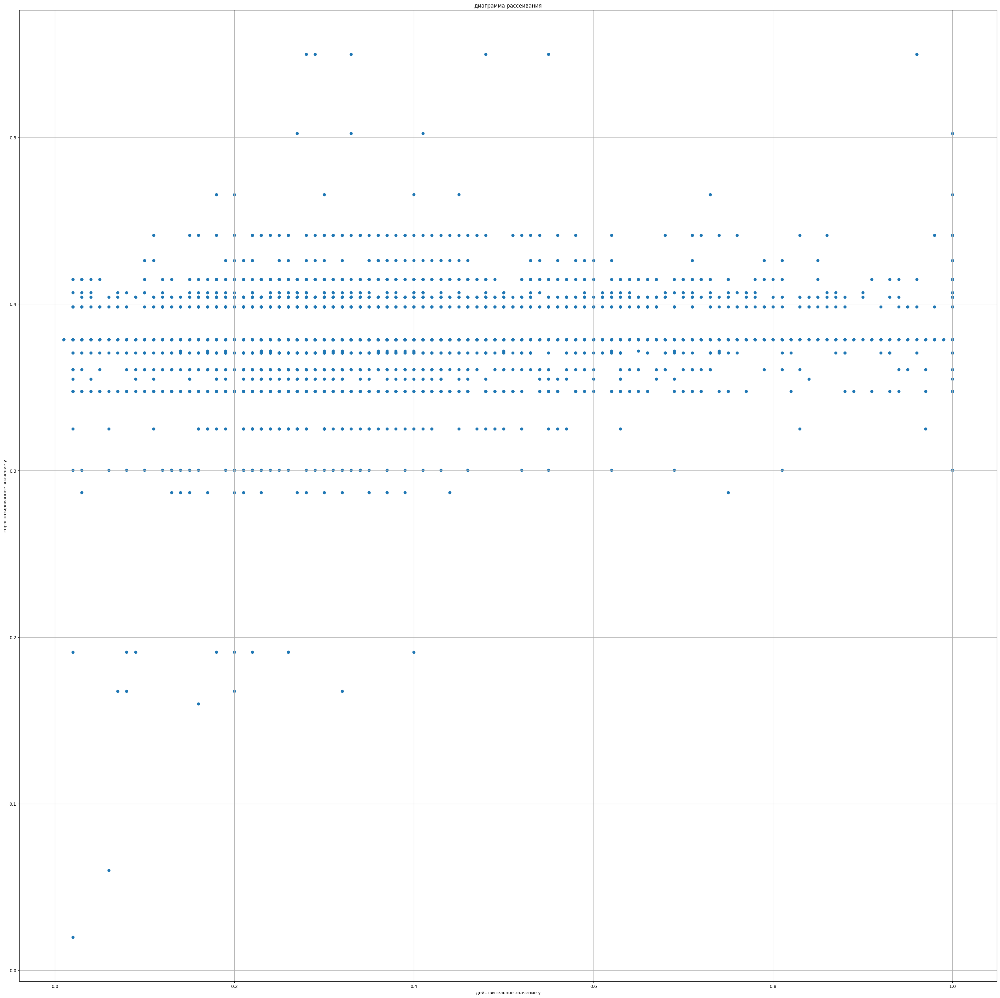

In [123]:
#оценка модели DecisionTreeRegressor для тренировочной выборки
y_dtr_train_pred = dtr_best_params.predict(X_train)
rmse = root_mean_squared_error(Y_train, y_dtr_train_pred)
r2 = r2_score(Y_train, y_dtr_train_pred)

print("для тренировочной выборки: ")
print("-----------------------------")
print("RMSE={}".format(rmse))
print("R2={}".format(r2))

plt.figure(figsize=(40,40))
plt.scatter(Y_train, y_dtr_train_pred)
plt.grid()
plt.xlabel("действительное значение y")
plt.ylabel("спрогнозированное значение y")
plt.title("диаграмма рассеивания")

для тренировочной выборки: 
-----------------------------
RMSE=0.20993587474862596
R2=-0.007748969391151883


Text(0.5, 1.0, 'диаграмма рассеивания')

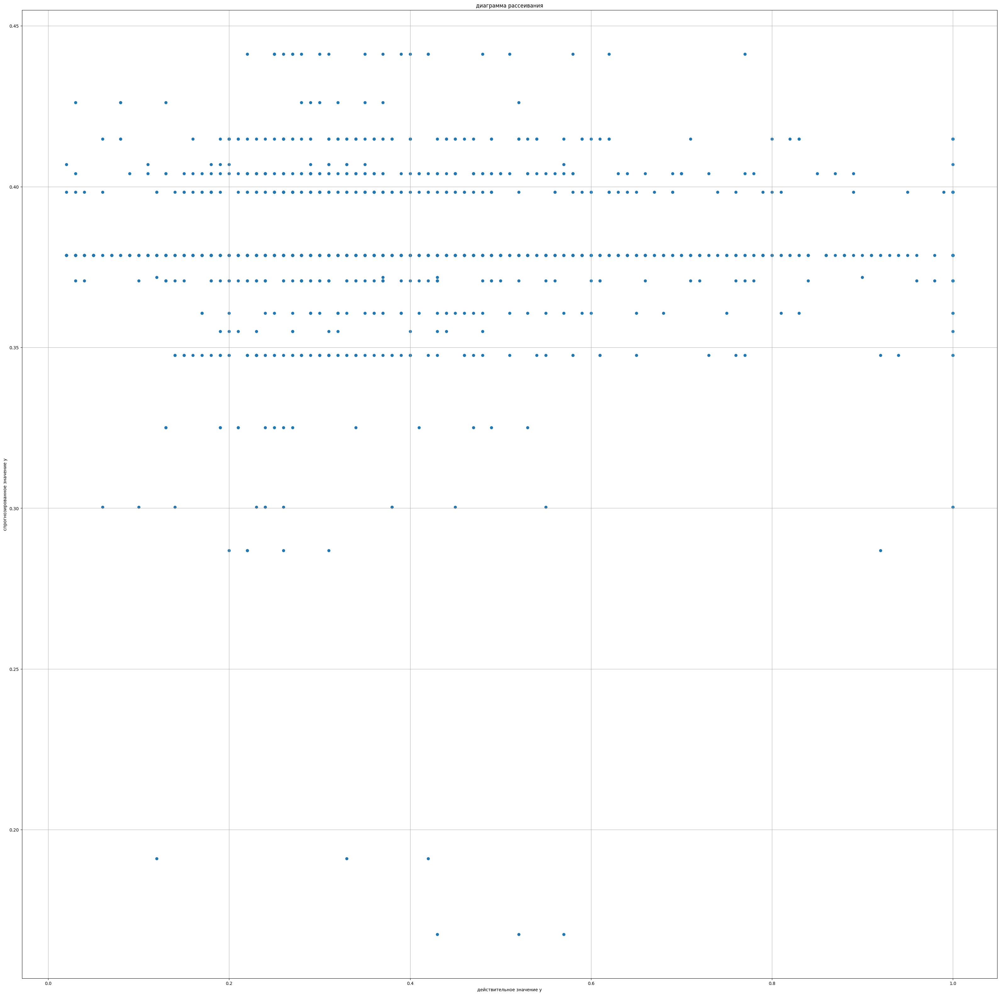

In [125]:
#оценка модели DecisionTreeRegressor для тестовой выборки
y_dtr_test_pred = dtr_best_params.predict(X_test)
rmse = root_mean_squared_error(Y_test, y_dtr_test_pred)
r2 = r2_score(Y_test, y_dtr_test_pred)

print("для тренировочной выборки: ")
print("-----------------------------")
print("RMSE={}".format(rmse))
print("R2={}".format(r2))

plt.figure(figsize=(40,40))
plt.scatter(Y_test, y_dtr_test_pred)
plt.grid()
plt.xlabel("действительное значение y")
plt.ylabel("спрогнозированное значение y")
plt.title("диаграмма рассеивания")

## RandomForestRegressor

для тренировочной выборки: 
-----------------------------
RMSE=0.2016293379151897
R2=0.03344294655516533


Text(0.5, 1.0, 'диаграмма рассеивания')

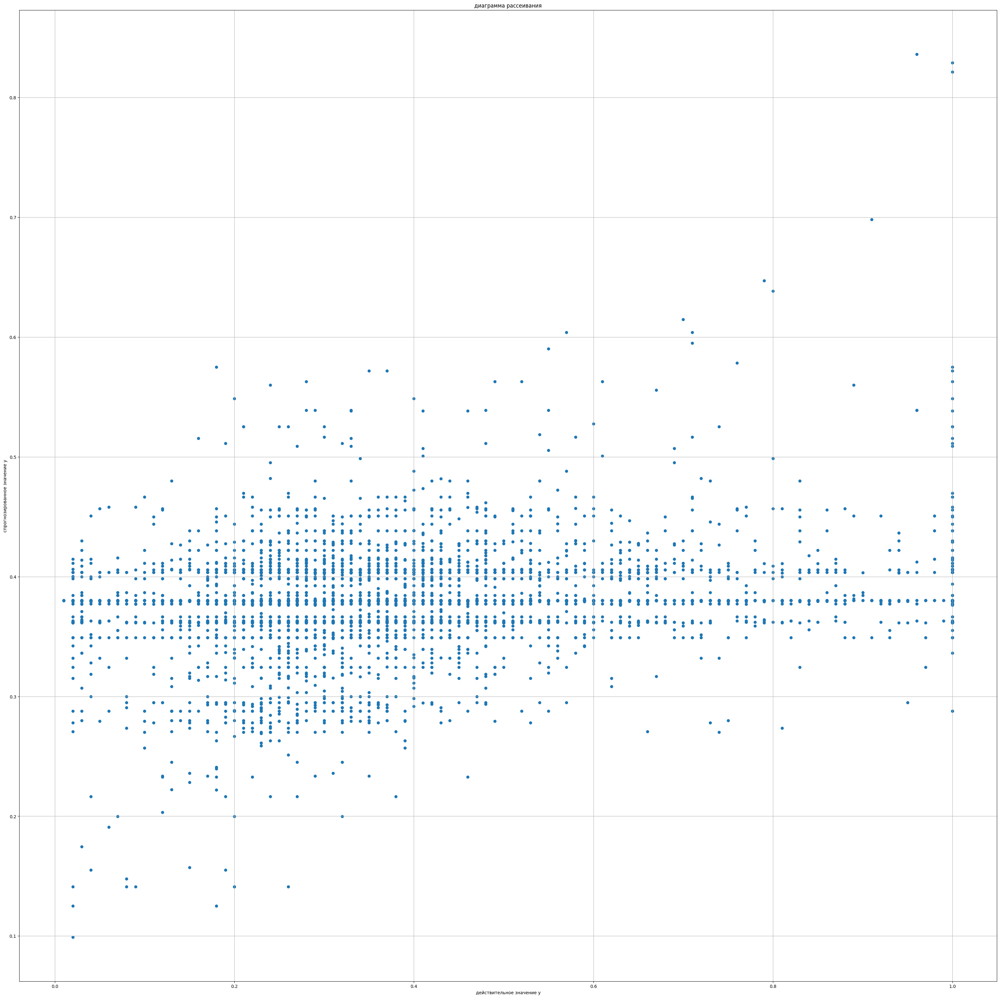

In [55]:
#оценка модели RandomForestRegressor для тренировочной выборки
y_rfr_train_pred = rfr.predict(X_train)
rmse = root_mean_squared_error(Y_train, y_rfr_train_pred)
r2 = r2_score(Y_train, y_rfr_train_pred)

print("для тренировочной выборки: ")
print("-----------------------------")
print("RMSE={}".format(rmse))
print("R2={}".format(r2))

plt.figure(figsize=(40,40))
plt.scatter(Y_train, y_rfr_train_pred)
plt.grid()
plt.xlabel("действительное значение y")
plt.ylabel("спрогнозированное значение y")
plt.title("диаграмма рассеивания")

для тестовой выборки: 
-----------------------------
RMSE=0.21065471429762173
R2=-0.0146620330884073


Text(0.5, 1.0, 'диаграмма рассеивания')

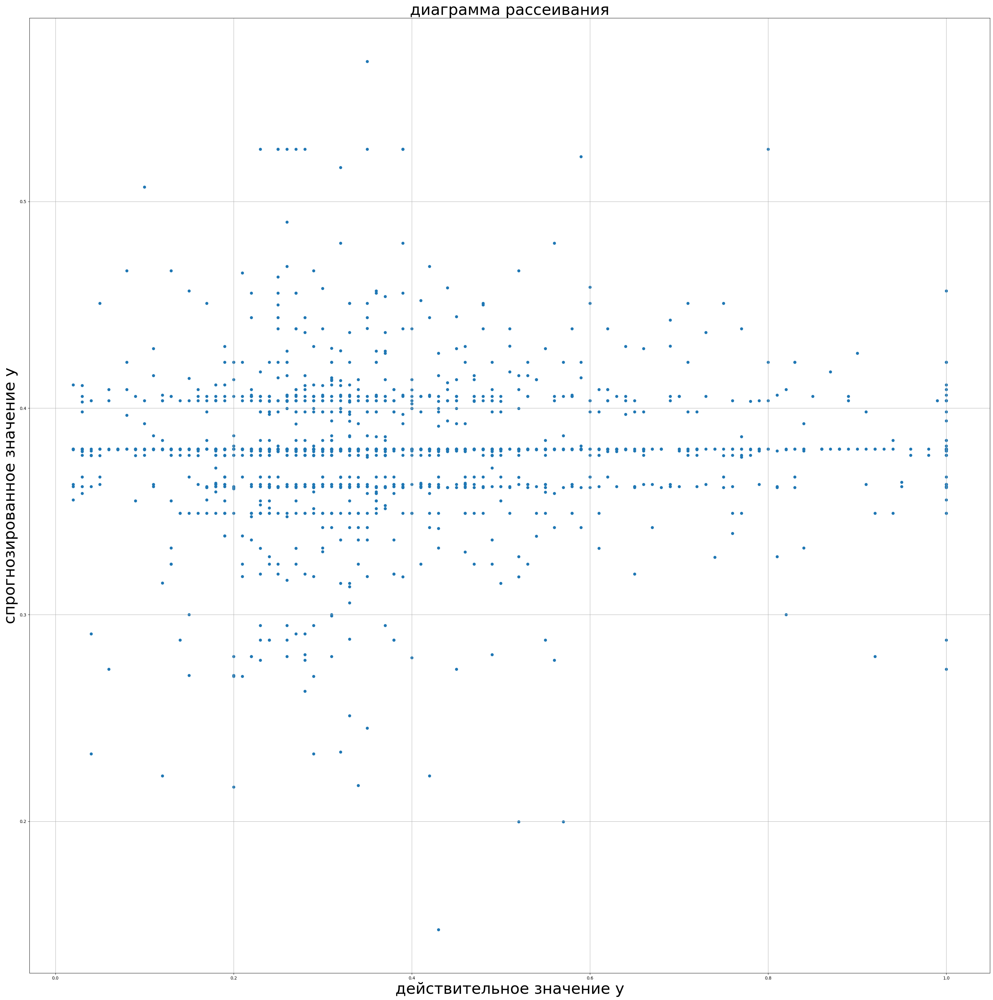

In [135]:
#оценка модели RandomForestRegressor для тестовой выборки
y_rfr_test_pred = rfr.predict(X_test)
rmse = root_mean_squared_error(Y_test, y_rfr_test_pred)
r2 = r2_score(Y_test, y_rfr_test_pred)

print("для тестовой выборки: ")
print("-----------------------------")
print("RMSE={}".format(rmse))
print("R2={}".format(r2))

plt.figure(figsize=(40,40))
plt.scatter(Y_test, y_rfr_test_pred)
plt.grid()
plt.xlabel("действительное значение y", fontsize=36)
plt.ylabel("спрогнозированное значение y",fontsize=36)
plt.title("диаграмма рассеивания",fontsize=36)

In [24]:
params_grid = {
'n_estimators':[100,150, 200],
'criterion': ['squared_error', 'friedman_mse', 'absolute_error'],
'max_depth':np.arange(1,11, 2).tolist(),
'min_samples_split':np.arange(2,11,2).tolist(),
'max_leaf_nodes':np.arange(3,15,2).tolist()
}

In [25]:
import time
start_time = time.time()
rfr_CV = GridSearchCV(estimator=RandomForestRegressor(), param_grid=params_grid, cv = 5)
rfr_CV.fit(X,Y)
dur = time.time() - start_time
print(dur)

KeyboardInterrupt: 

In [139]:
rfr_CV.best_params_

AttributeError: 'GridSearchCV' object has no attribute 'best_params_'

In [ ]:
2+2

## SVR 

для тренировочной выборки: 
-----------------------------
RMSE=0.20436510046387
R2=0.0070359790735627925


Text(0.5, 1.0, 'диаграмма рассеивания')

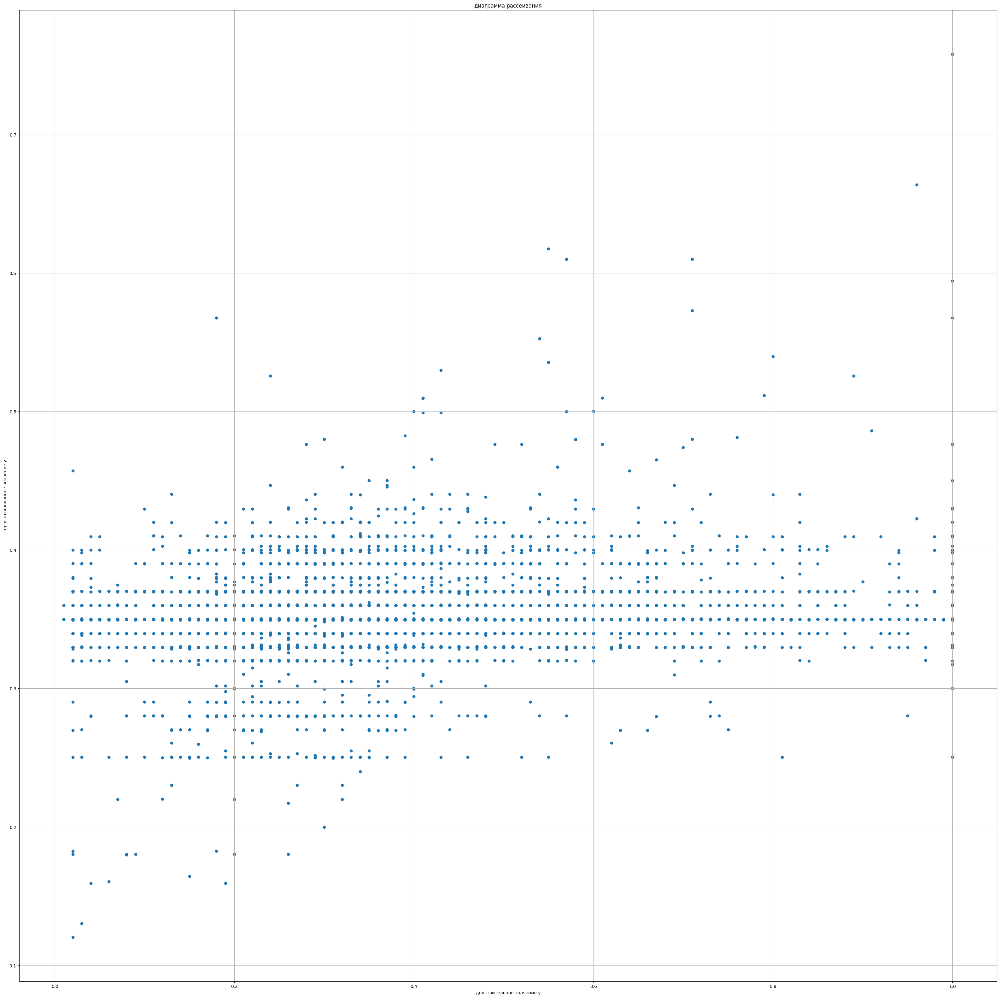

In [57]:
#оценка модели SVR для тренировочной выборки
y_svr_train_pred = svr.predict(X_train)
rmse = root_mean_squared_error(Y_train, y_svr_train_pred)
r2 = r2_score(Y_train, y_svr_train_pred)

print("для тренировочной выборки: ")
print("-----------------------------")
print("RMSE={}".format(rmse))
print("R2={}".format(r2))

plt.figure(figsize=(40,40))
plt.scatter(Y_train, y_svr_train_pred)
plt.grid()
plt.xlabel("действительное значение y")
plt.ylabel("спрогнозированное значение y")
plt.title("диаграмма рассеивания")

In [54]:
#оценка модели SVR для тестовой выборки
y_svr_test_pred = svr.predict(X_test)
rmse = root_mean_squared_error(Y_test, y_svr_test_pred)
r2 = r2_score(Y_test, y_svr_test_pred)

print("для тестовой выборки: ")
print("-----------------------------")
print("RMSE={}".format(rmse))
print("R2={}".format(r2))

plt.figure(figsize=(40,40))
plt.scatter(Y_test, y_svr_test_pred)
plt.grid()
plt.xlabel("действительное значение y")
plt.ylabel("спрогнозированное значение y")
plt.title("диаграмма рассеивания")

NameError: name 'svr' is not defined

In [26]:
#TODO: подобрать гиперпараметры

In [33]:
params_grid = {
'kernel':['poly','rbf', 'sigmoid'],
'degree': [2,3,4],
'gamma':['scale','auto'],
'C':[0.1,1,10,100],
'epsilon':[0.1, 0.001,0.0001]
}

In [34]:
import time
start_time = time.time()
svr_CV = GridSearchCV(estimator=SVR(), param_grid=params_grid, cv = 5)
svr_CV.fit(X_train,Y_train)
dur = time.time() - start_time
print(dur)

2507.2140793800354


In [37]:
svr_CV.best_params_

{'C': 1, 'degree': 4, 'epsilon': 0.1, 'gamma': 'auto', 'kernel': 'poly'}

In [66]:
svr_best = SVR(kernel="poly", degree=4, gamma="auto", C=1, epsilon=0.1)

{'C': 1, 'degree': 4, 'epsilon': 0.1, 'gamma': 'auto', 'kernel': 'poly'}

In [67]:
hist_svr_best=svr_best.fit(X_train, Y_train)

для тренировочной выборки: 
-----------------------------
RMSE=0.205900477073288
R2=-0.007940166274907456


Text(0.5, 1.0, 'диаграмма рассеивания')

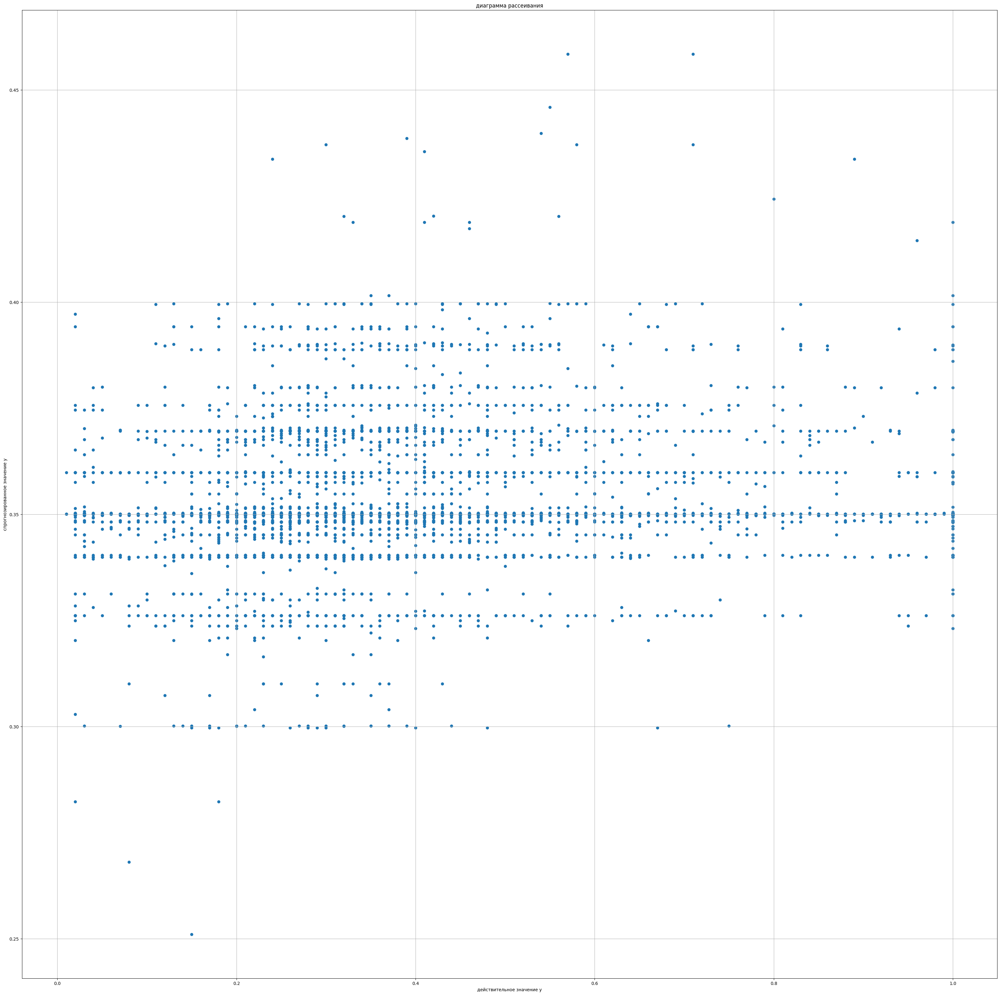

In [68]:
#оценка модели SVR для тренировочной выборки
y_svr_train_pred = svr_best.predict(X_train)
rmse = root_mean_squared_error(Y_train, y_svr_train_pred)
r2 = r2_score(Y_train, y_svr_train_pred)

print("для тренировочной выборки: ")
print("-----------------------------")
print("RMSE={}".format(rmse))
print("R2={}".format(r2))

plt.figure(figsize=(40,40))
plt.scatter(Y_train, y_svr_train_pred)
plt.grid()
plt.xlabel("действительное значение y")
plt.ylabel("спрогнозированное значение y")
plt.title("диаграмма рассеивания")

для тренировочной выборки: 
-----------------------------
RMSE=0.2119876793199514
R2=-0.02754366411542275


Text(0.5, 1.0, 'диаграмма рассеивания')

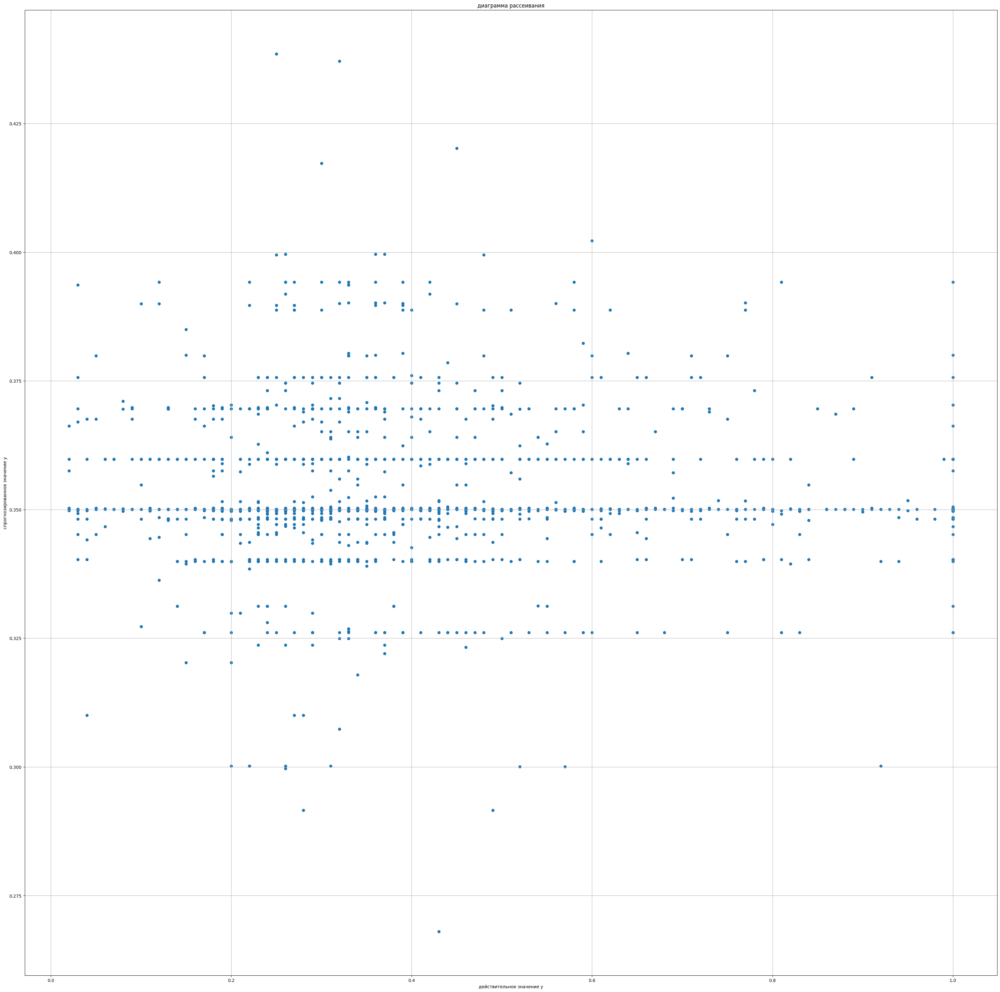

In [71]:
#оценка модели SVR для тестовой выборки
y_svr_test_pred = svr_best.predict(X_test)
rmse = root_mean_squared_error(Y_test, y_svr_test_pred)
r2 = r2_score(Y_test, y_svr_test_pred)

print("для тренировочной выборки: ")
print("-----------------------------")
print("RMSE={}".format(rmse))
print("R2={}".format(r2))

plt.figure(figsize=(40,40))
plt.scatter(Y_test, y_svr_test_pred)
plt.grid()
plt.xlabel("действительное значение y")
plt.ylabel("спрогнозированное значение y")
plt.title("диаграмма рассеивания")


## AdaBoost

для тренировочной выборки: 
-----------------------------
RMSE=0.2081221317541639
R2=-0.02980875011266959


Text(0.5, 1.0, 'диаграмма рассеивания')

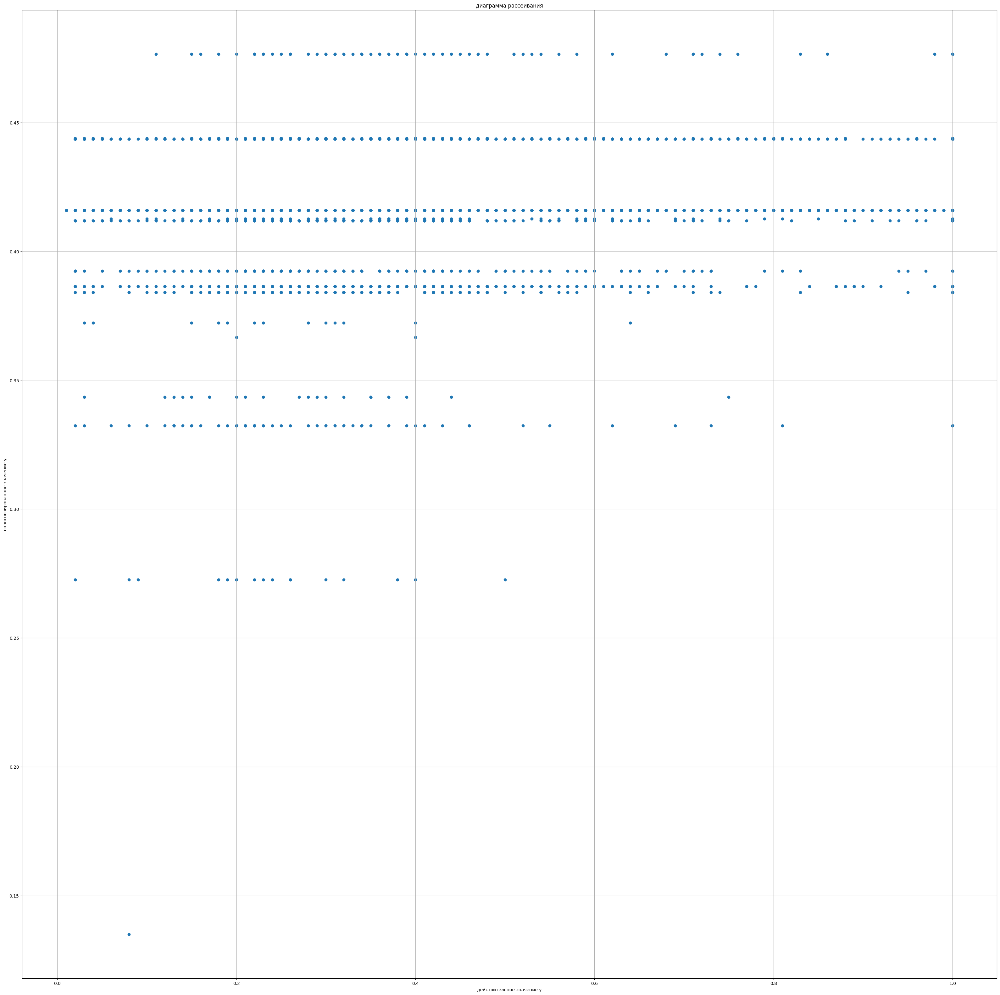

In [62]:
#оценка модели SVR для тренировочной выборки
y_abr_train_pred = abr.predict(X_train)
rmse = root_mean_squared_error(Y_train, y_abr_train_pred)
r2 = r2_score(Y_train, y_abr_train_pred)

print("для тренировочной выборки: ")
print("-----------------------------")
print("RMSE={}".format(rmse))
print("R2={}".format(r2))

plt.figure(figsize=(40,40))
plt.scatter(Y_train, y_abr_train_pred)
plt.grid()
plt.xlabel("действительное значение y")
plt.ylabel("спрогнозированное значение y")
plt.title("диаграмма рассеивания")

для тренировочной выборки: 
-----------------------------
RMSE=0.21245538223567645
R2=-0.03208275167538921


Text(0.5, 1.0, 'диаграмма рассеивания')

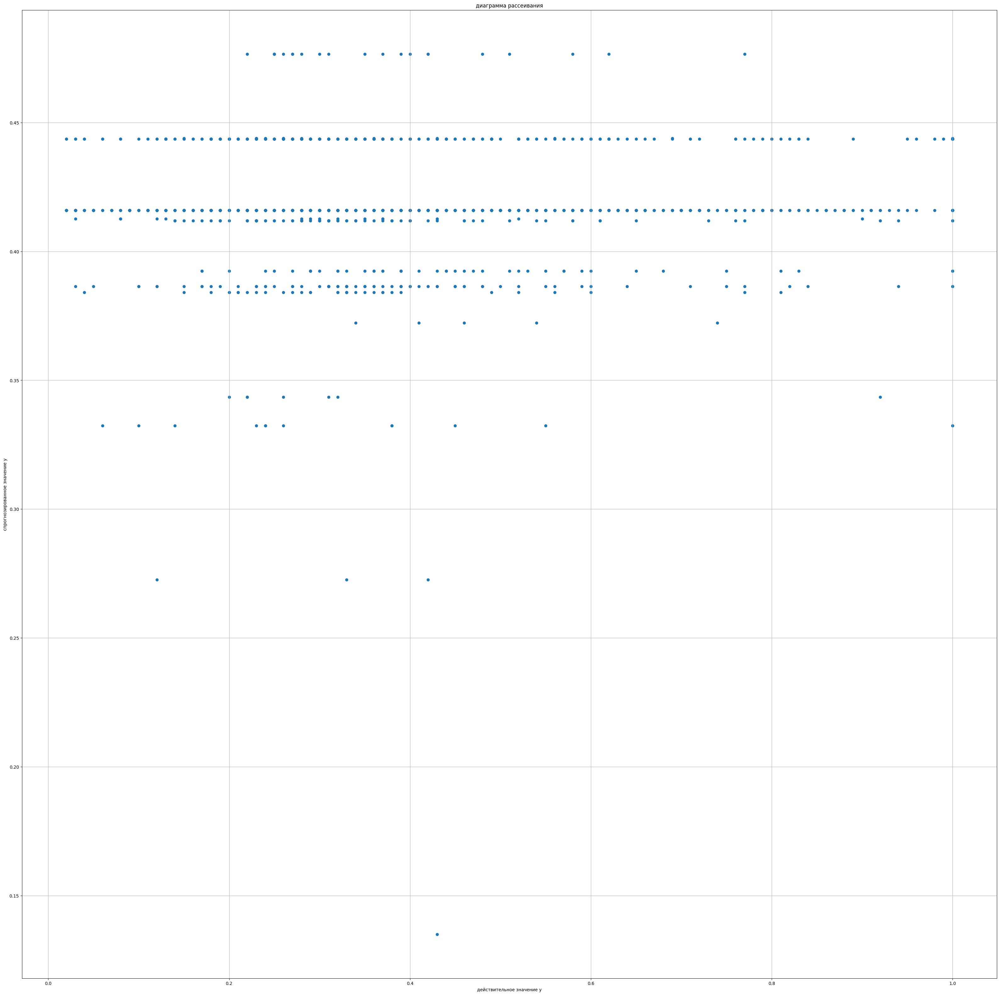

In [64]:
#оценка модели AdaBoost для тестовой выборки
y_abr_test_pred = abr.predict(X_test)
rmse = root_mean_squared_error(Y_test, y_abr_test_pred)
r2 = r2_score(Y_test, y_abr_test_pred)

print("для тренировочной выборки: ")
print("-----------------------------")
print("RMSE={}".format(rmse))
print("R2={}".format(r2))

plt.figure(figsize=(40,40))
plt.scatter(Y_test, y_abr_test_pred)
plt.grid()
plt.xlabel("действительное значение y")
plt.ylabel("спрогнозированное значение y")
plt.title("диаграмма рассеивания")